## <font color = 'green' id = "section" > Portofolio: Le prix du carburant en France</font>

# <font color="blue">Sommaire</font>
1. [Importation des librairies](#section_1)    
2. [Lecture du Dataset](#section_2) 
3. [Inventaire des valeurs manquantes](#section_3)         
4. [Description statistique et distribution](#section_4)       
5. [Traitement des coordonnées géographiques](#section_5)     
6. [Traitement des valeurs manquantest](#section_6)      
7. [Analyse exploratoire](#section_7)  
    7.1. [Analyse univariée](#section_7_1)    
    7.2. [Analyse bivariée et multivariée](#section_7_2)  
8. [ Geolocalisation des stations services](#section_8)    
    8.1. [Geolocalisation des 15 lieux où SP98 est le plus cher](#section_8_1)         
    8.2. [Geolocalisation des 15 lieux où SP98 est le moins cher](#section_8_2)  
    8.3. [Geolocalisation des 10 lieux où SP95 est le moins cher](#section_8_3)    
    8.4. [Geolocalisation des 10 lieux où SP95 est le moins cher](#section_8_4) 


# <font color ='red' id = 'section_1' > 1.Importation des librairies </font>

In [1]:
import warnings
warnings.filterwarnings('ignore')
warnings.warn('DelftStack')
warnings.warn('Do not show this message')
print("No Warning Shown")

No Warning Shown


In [2]:
import pandas as pd
import numpy as np
import scipy.stats as st
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import ast
import scipy as sp
import time
import pickle
from datetime import datetime
#-------------------------------------------------------------------
from tqdm import tqdm
import gc
#------------------------------------------------------------------
import plotly.graph_objs as go
import plotly.express as px
from textwrap import wrap

In [3]:
pd.set_option("display.max_columns", 500)
pd.set_option("display.max_rows", 500)

## Checklist

Les données mises à disposition sont les informations extraites du système d’information « Prix Carburants ». Ces données concernent les points de ventes ouverts référencés sur le site https://www.prix-carburants.gouv.fr (Arrêté ministériel du 12 décembre 2006).

Les données disponibles comprennent :

Les informations générales sur le point de vente : adresse, coordonnées géographiques, horaires d’ouverture et services proposés ;
Les prix et les informations figurant dans le système d’information;
Les ruptures de stock de carburants ;
Les fermetures définitives ou temporaires des points de vente.
Le flux de données instantané est mis à jour instantanément toutes les 10 minutes.

# Objectif
Notre objectif majeur dans ce projet est d'estimer:
* Nettoyage structuée des données brutes
* Analyse exploratoire afin d'identifier 
    * L'évolurion du prix du carbutant par jour, mois, années
    * Localisation de  la zone(Ville, région)  où le carburant est le moins cher
    * Le types de carburant le moins cher

# Description des données

lien vers les données: https://data.economie.gouv.fr/explore/dataset/prix-carburants-fichier-instantane-test-ods-copie/table/


# <font color="red" id="section_2"> 2. Chargement, lecture  et apercu  des données</font>

In [4]:
df_carburant = pd.read_csv("prix-carburants-fichier-instantane-test-ods-copie.csv", sep = ';')

In [5]:
df_carburant.sample(2)

,id,cp,pop,adresse,ville,horaires,geom,prix_maj,prix_id,prix_valeur,prix_nom,com_arm_code,com_arm_name,epci_code,epci_name,dep_code,dep_name,reg_code,reg_name,com_code,com_name,services_service,horaires_automate_24_24
343,59113008,59113,A,AUTOROUTE A1 - AIRE DE PHALEMPIN OUEST,SECLIN,"{""@automate-24-24"": ""1"", ""jour"": [{""@id"": ""1"",...","50.533,3.046",2022-11-19T10:00:00+01:00,4.0,0.954,GPLc,59560,Seclin,200093201.0,Métropole Européenne de Lille,59,Nord,32.0,Hauts-de-France,59560,Seclin,Douches//Boutique alimentaire//Station de gonf...,Oui
356,57380002,57380,R,"42, rue de Créhange",FAULQUEMONT,"{""@automate-24-24"": ""1"", ""jour"": [{""@id"": ""1"",...","49.048,6.593",2022-10-29T16:49:53+02:00,6.0,1.749,SP98,57209,Faulquemont,245700133.0,CC du District Urbain de Faulquemont (DUF),57,Moselle,44.0,Grand Est,57209,Faulquemont,Toilettes publiques//Boutique alimentaire//Bou...,Oui


In [6]:
df_carburant.shape

(31014, 23)

## <font color="red" id="section_3" > 3. Inventaire des valeurs manquantes

In [7]:
def rech_taux_remplissage(data):
    dict_var = {}
    for col in data.columns:
        dict_var[col] =[]
        dict_var[col].append((data[col].notna().sum()/data.shape[0])*100)
        dict_var[col].append(data[col].isna().sum())
    return pd.DataFrame.from_dict(data= dict_var,orient = 'index',
                                  columns= ['Taux_remplissage', 'Valeurs manquantes']).sort_values(by ='Taux_remplissage',
                                                                                                ascending =False)

In [8]:
rech_taux_remplissage(df_carburant)

,Taux_remplissage,Valeurs manquantes
id,100.000000,0
ville,100.000000,0
cp,100.000000,0
geom,100.000000,0
horaires_automate_24_24,100.000000,0
pop,100.000000,0
adresse,100.000000,0
com_arm_code,99.961308,12
dep_code,99.961308,12
com_name,99.961308,12


## Commentaire :
Avant d'aller plus loins dans l'exploration de nos jeu de données, nous allons sélectioner les variables pertinentes.

In [9]:
list_var_suppr = ["pop", "horaires","dep_name", "reg_code", "com_code", "com_name", "com_arm_code",
                  "com_arm_name", "epci_code", "epci_name"]

In [10]:
df_carburant.drop(list_var_suppr, axis = 1, inplace = True)

In [11]:
df_carburant.head(3)

,id,cp,adresse,ville,geom,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,"45.917,6.128",2022-11-18T20:10:00+01:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,NaN,Non
1,6140005,6140,976 avenue rhin et danube,vence,"43.7251854,7.0962481",2022-11-18T14:24:06+01:00,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non
2,43110001,43110,Avenue de Firminy,AUREC-SUR-LOIRE,"45.36955,4.20235",2022-11-19T09:04:21+01:00,1.0,2.065,Gazole,43,Auvergne-Rhône-Alpes,Vente de fioul domestique//Vente de pétrole la...,Non


In [12]:
df_carburant.dtypes.value_counts()

object     9
int64      2
float64    2
dtype: int64

In [13]:
df_carburant.isna().sum()

id                            0
cp                            0
adresse                       0
ville                         0
geom                          0
prix_maj                    506
prix_id                     506
prix_valeur                 506
prix_nom                    506
dep_code                     12
reg_name                     12
services_service           2464
horaires_automate_24_24       0
dtype: int64

In [14]:
df_carburant['cp'] = df_carburant['cp'].astype('object')

## <font color="red" id="section_4" > 4. Description statistique et distribution

In [15]:
df_carburant.describe()

,id,prix_id,prix_valeur
count,3.101400e+04,30508.000000,30508.000000
mean,4.918708e+07,3.425069,1.726170
std,2.626591e+07,2.022424,0.346889
min,1.000001e+06,1.000000,0.234000
25%,2.816251e+07,1.000000,1.729000
50%,4.940001e+07,3.000000,1.829000
75%,7.157750e+07,5.000000,1.899000
max,9.587001e+07,6.000000,2.900000


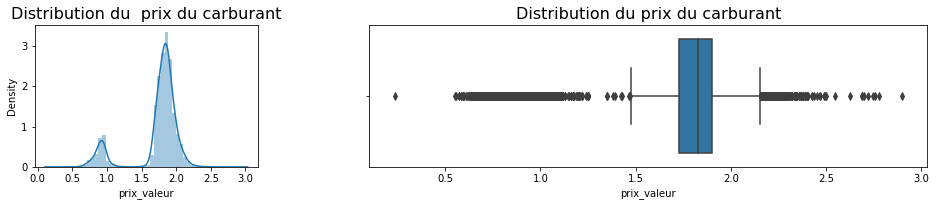

In [16]:
fig = plt.figure(figsize = (16,12))
grid = plt.GridSpec(3, 3, wspace=0.5, hspace=0.8)
ax0 = plt.subplot(grid[0, 0:1])
ax0= sns.distplot(df_carburant['prix_valeur'])
plt.title("Distribution du  prix du carburant", fontsize = 16)
plt.draw()
axà = plt.subplot(grid[0, 1:])
ax0= sns.boxplot(x= df_carburant['prix_valeur'], data = df_carburant,showfliers =True)
plt.title("Distribution du prix du carburant", fontsize = 16)
plt.draw()

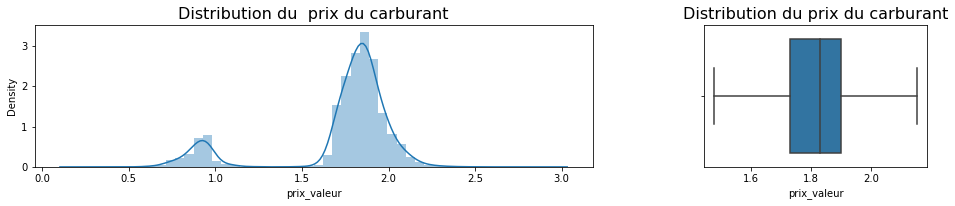

In [17]:
fig = plt.figure(figsize = (16,12))
grid = plt.GridSpec(3, 3, wspace=0.5, hspace=0.8)
ax0 = plt.subplot(grid[0, 0:2])
ax0= sns.distplot(df_carburant['prix_valeur'])
plt.title("Distribution du  prix du carburant", fontsize = 16)
plt.draw()
axà = plt.subplot(grid[0, 2:])
ax0= sns.boxplot(x= df_carburant['prix_valeur'], data = df_carburant,showfliers =False)
plt.title("Distribution du prix du carburant", fontsize = 16)
plt.draw()

# Commentaire : 
* Les distributions ne suivent pas une loi normale et on peut que l'ensemble du territoire français, le prix du carburant oscillent entre **1,72 euros et 1,89 euros**

* Pas de valeurs aberrantes

# <font color = 'red' id = 'section_5'> 5. Traitement des coordonnées géographiques
Dans cette partie, on va détailler comment casser la variable _geom_ en **Latitude** et **Longitude**.

In [18]:
df_carburant['geom'].head(3)

0            45.917,6.128
1    43.7251854,7.0962481
2        45.36955,4.20235
Name: geom, dtype: object

In [19]:
type(df_carburant['geom'])

pandas.core.series.Series

In [20]:
for i in   tqdm(df_carburant.index):
    df_carburant['geom'][i] = df_carburant['geom'][i].split(',')

100%|██████████| 31014/31014 [14:45<00:00, 35.01it/s]  


In [21]:
def latt_long(data):
    latitude_list = []
    longitude_list = []
    for j in  tqdm(data.index):
        latitude_list.append(data['geom'][j][0])
        longitude_list.append(data['geom'][j][1])
    #creation de variable longitude et latitude
    data["Latitude"] = latitude_list
    data['Longitude'] = longitude_list
    #Changement de type en float
    data['Latitude'] = data['Latitude'].astype('float')
    data['Longitude'] = data['Longitude'].astype('float')
    return data

In [22]:
df_carburant = latt_long(df_carburant)

100%|██████████| 31014/31014 [00:00<00:00, 39718.78it/s]


In [23]:
df_carburant.head(3)

,id,cp,adresse,ville,geom,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,"[45.917, 6.128]",2022-11-18T20:10:00+01:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,NaN,Non,45.917000,6.128000
1,6140005,6140,976 avenue rhin et danube,vence,"[43.7251854, 7.0962481]",2022-11-18T14:24:06+01:00,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non,43.725185,7.096248
2,43110001,43110,Avenue de Firminy,AUREC-SUR-LOIRE,"[45.36955, 4.20235]",2022-11-19T09:04:21+01:00,1.0,2.065,Gazole,43,Auvergne-Rhône-Alpes,Vente de fioul domestique//Vente de pétrole la...,Non,45.369550,4.202350


In [24]:
df_carburant.drop(['geom'], axis =1, inplace = True )

# <font color = 'red' id = 'section_6'> 6. Traitement des valeurs manquantes

In [25]:
df_carburant.isna().sum()

id                            0
cp                            0
adresse                       0
ville                         0
prix_maj                    506
prix_id                     506
prix_valeur                 506
prix_nom                    506
dep_code                     12
reg_name                     12
services_service           2464
horaires_automate_24_24       0
Latitude                      0
Longitude                     0
dtype: int64

**services_service**

In [26]:
df_carburant.loc[df_carburant['services_service'].isna(), "services_service"] = "Aucune"

**reg_name**

In [27]:
df_carburant.loc[df_carburant['dep_code'].isna(),["cp", 'ville', 'adresse', 'prix_nom','reg_name' ]].groupby('ville').head()

,cp,ville,adresse,prix_nom,reg_name
170,56700,Kervignac,KERNOUS,E10,NaN
410,83150,BANDOL,CAPITAINERIE DU PORT,SP95,NaN
5581,83380,LES ISSAMBRES,SAN PEIRE,SP98,NaN
7421,17200,Royan,quai des sabliers,Gazole,NaN
8461,17200,Royan,quai des sabliers,SP98,NaN
10828,20260,CALVI,RN 197 LIEU-DIT LES PADULES,SP95,NaN
13337,20260,CALVI,RN 197 LIEU-DIT LES PADULES,Gazole,NaN
16010,20260,CALVI,RN 197 LIEU-DIT LES PADULES,GPLc,NaN
25931,83150,BANDOL,CAPITAINERIE DU PORT,Gazole,NaN
27716,56700,Kervignac,KERNOUS,SP98,NaN


In [28]:
#le CODE 56 correspond à bretagne
df_carburant.loc[df_carburant['services_service'].index ==170, "reg_name"] = "Bretagne"
df_carburant.loc[df_carburant['services_service'].index ==27716, "reg_name"] = "Bretagne"
df_carburant.loc[df_carburant['services_service'].index ==29147, "reg_name"] = "Bretagne"
#le CODE 83 correspond à Provence-Alpes-Côte d'Azur
df_carburant.loc[df_carburant['services_service'].index ==410, "reg_name"] = "Provence-Alpes-Côte d'Azur"
df_carburant.loc[df_carburant['services_service'].index ==5581, "reg_name"] = "Provence-Alpes-Côte d'Azur"
df_carburant.loc[df_carburant['services_service'].index ==25931, "reg_name"] = "Provence-Alpes-Côte d'Azur"
df_carburant.loc[df_carburant['services_service'].index ==28009, "reg_name"] = "Provence-Alpes-Côte d'Azur"
#le CODE 17 correspond à Poitou-Charentes
df_carburant.loc[df_carburant['services_service'].index ==7421, "reg_name"] = "Poitou-Charentes"
df_carburant.loc[df_carburant['services_service'].index ==8461, "reg_name"] = "Poitou-Charentes"
#le CODE 20 correspond à Poitou-Charentes
df_carburant.loc[df_carburant['services_service'].index ==10828, "reg_name"] = "Corse"
df_carburant.loc[df_carburant['services_service'].index ==13337, "reg_name"] = "Corse"
df_carburant.loc[df_carburant['services_service'].index ==16010, "reg_name"] = "Corse"

### prix_maj; 	prix_id; 	prix_valeur; 	prix_nom

In [29]:
df_carburant.loc[df_carburant['prix_valeur'].isna(),:].head(2)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
3,79000004,79000,226 Avenue de la Rochelle,Niort,NaN,NaN,NaN,NaN,79,Nouvelle-Aquitaine,Boutique alimentaire//Boutique non alimentaire...,Non,46.31087,-0.48038
5,78800006,78800,136 RUE HENRI BARBUSSE,HOUILLES,NaN,NaN,NaN,NaN,78,Île-de-France,Boutique non alimentaire//Station de gonflage/...,Oui,48.93200,2.18200


### Commentaire:
En Data sciences, débutant comme senior sont tous concernés par le même phénomène lorqu'il s'agit de traiter les valeurs manqantes. Pendant ma formation, mon mentor me met toujours en garde de ne pas supprimer les **NAN**  même si globalement la colonne en contient énormémment. J'ai toujours gardé ce conseil dans un coin de ma tête.

Sur ce, ici, faut t-il supprimer les lignes ou éssayer de les imputer automatiquement ?
La réponse la plus relfléchie constitue justement à régarder de plus près la nature de notre jeu de données. Nous traitons ici des prix de carburant, donc des stations de services. Puisque nous avons  ni les données des **Prix_maj**; ni **prix_id**; ni **prix_valeur**;	ni **prix_nom**, donc nécessairement on peut penser que la station corresppondante n'est plus en service ou a été demantélée.

**Conclusion**: Nlous allons supprimer ces lignes.

In [30]:
df_carburant.dropna(inplace =True)

## Vérification

In [31]:
df_carburant.isna().sum()

id                         0
cp                         0
adresse                    0
ville                      0
prix_maj                   0
prix_id                    0
prix_valeur                0
prix_nom                   0
dep_code                   0
reg_name                   0
services_service           0
horaires_automate_24_24    0
Latitude                   0
Longitude                  0
dtype: int64

# <font color = 'red' id = 'section_7'> 7. Analyse exploratoire
## <font color = 'red' id = 'section_7_1'> 7.1 Analyse univariée

In [32]:
df_carburant.groupby('prix_nom')['prix_valeur'].describe().T

prix_nom,E10,E85,GPLc,Gazole,SP95,SP98
count,6540.000000,2825.000000,1364.000000,9273.000000,3603.000000,6891.000000
mean,1.767304,0.913148,0.889190,1.926533,1.819945,1.867168
std,0.093634,0.095409,0.132418,0.090112,0.101221,0.104965
min,0.809000,0.580000,0.549000,0.234000,1.423000,1.545000
25%,1.706000,0.879000,0.819000,1.868000,1.759000,1.799000
50%,1.747000,0.919000,0.879000,1.899000,1.799000,1.839000
75%,1.800000,0.959000,0.954000,1.969000,1.869000,1.911000
max,2.429000,2.290000,2.494000,2.760000,2.900000,2.780000


# Commentaire
Les super carburant **SP95** et **SP98** qui sont les plus utilsés en raison de leurs qualités sur le moteur ont les prix qui oscillent :
* entre **1,42 euros et 2,96 euros** pour **SP95** 
* contre **1,54 euros et 2,78 euros**  pour le **SP98**.

In [33]:
df_carburant.groupby(['reg_name','prix_nom'] )['prix_valeur'].describe().T

reg_name Auvergne-Rhône-Alpes                                       \
prix_nom                  E10         E85        GPLc       Gazole   
count              781.000000  315.000000  164.000000  1243.000000   
mean                 1.804010    0.925778    0.908817     1.936516   
std                  0.093337    0.109082    0.106263     0.084082   
min                  1.169000    0.639000    0.572000     1.729000   
25%                  1.739000    0.899000    0.837000     1.869000   
50%                  1.792000    0.939000    0.908000     1.920000   
75%                  1.849000    0.959000    0.979000     1.989000   
max                  2.239000    1.989000    1.105000     2.374000   

reg_name                         Bourgogne-Franche-Comté              \
prix_nom        SP95        SP98                     E10         E85   
count     502.000000  709.000000              356.000000  146.000000   
mean        1.871986    1.916238                1.813840    0.910000   
std         0.108701    0.105020                0.101996    0.077762   
min         1.481000    1.577000                1.619000    0.739000   
25%         1.799000    1.835000                1.740000    0.889250   
50%         1.855000    1.899000                1.779000    0.909000   
75%         1.929000    1.988000                1.868250    0.959000   
max         2.260000    2.290000                2.139000    1.199000   

reg_name                                                   Bretagne  \
prix_nom       GPLc      Gazole        SP95        SP98         E10   
count     74.000000  623.000000  282.000000  386.000000  384.000000   
mean       0.907703    1.939838    1.892546    1.928832    1.701693   
std        0.145794    0.082648    0.111756    0.111812    0.059577   
min        0.632000    1.430000    1.509000    1.643000    1.481000   
25%        0.809250    1.889000    1.799000    1.829250    1.674750   
50%        0.899000    1.919000    1.899000    1.901000    1.692000   
75%        1.034000    1.979000    1.999000    2.049000    1.719250   
max        1.389000    2.264000    2.169000    2.234000    1.973000   

reg_name                                                             \
prix_nom         E85       GPLc      Gazole        SP95        SP98   
count     168.000000  81.000000  537.000000  258.000000  441.000000   
mean        0.901304   0.872259    1.884451    1.747298    1.793320   
std         0.107739   0.161830    0.062823    0.073948    0.068761   
min         0.739000   0.595000    1.711000    1.536000    1.591000   
25%         0.879000   0.799000    1.849000    1.699000    1.755000   
50%         0.899000   0.869000    1.869000    1.739000    1.798000   
75%         0.951500   0.919000    1.898000    1.770750    1.803000   
max         1.985000   1.999000    2.378000    2.136000    2.063000   

reg_name Centre-Val de Loire                                                 \
prix_nom                 E10         E85       GPLc      Gazole        SP95   
count             299.000000  128.000000  68.000000  423.000000  159.000000   
mean                1.765204    0.915773   0.877971    1.931104    1.799233   
std                 0.114543    0.071653   0.121480    0.096739    0.070068   
min                 1.482000    0.719000   0.599000    1.750000    1.591000   
25%                 1.699000    0.899000   0.799000    1.878500    1.759000   
50%                 1.727000    0.930000   0.871500    1.899000    1.785000   
75%                 1.769500    0.959000   0.954000    1.951000    1.835000   
max                 2.294000    1.172000   1.108000    2.454000    1.999000   

reg_name             Corse                                     Grand Est  \
prix_nom        SP98   E10      GPLc      Gazole        SP95         E10   
count     335.000000  1.00  12.00000  129.000000  129.000000  583.000000   
mean        1.855101  1.58   1.21375    1.913814    1.846357    1.771501   
std         0.111926   NaN   0.04184    0.073524    0.094825 

# Commentaire
Par exemple pour la région **Auvergne-Rhône-Alpes**, le  prix  du **SP98** se situe  pour la plupart des stations services entre **1.57 euros et 1,98 euros**.

## <font color = 'red' id = 'section_7_2'> 7.2 Analyse bivariée ou multivariée

In [34]:
df_carburant.head(2)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,2022-11-18T20:10:00+01:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,Aucune,Non,45.917000,6.128000
1,6140005,6140,976 avenue rhin et danube,vence,2022-11-18T14:24:06+01:00,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non,43.725185,7.096248


## <font color = 'red' id = 'section_7_2_1'> 7.2.1 L'évolution du prix à la pompe en fonction de la région

In [35]:
from datetime import datetime

In [36]:
df_carburant_clean = df_carburant.copy()

In [37]:
df_carburant_clean['prix_maj'].head(2)

0    2022-11-18T20:10:00+01:00
1    2022-11-18T14:24:06+01:00
Name: prix_maj, dtype: object

### Commentaire : 
Nous allons traiter les date au format iso en datetime pandas en utilisant la librairie dateutil

In [38]:
from dateutil.parser import parse
df_carburant_clean['prix_maj'] = df_carburant_clean['prix_maj'].apply(lambda x : parse(x)) 

In [39]:
def tz_datetime(date_tz):
    date_obj = datetime.strftime(date_tz, '%Y-%m-%d %H:%M:%S') 
    return date_obj

In [40]:
df_carburant_clean['prix_maj'] = df_carburant_clean['prix_maj'].apply(tz_datetime)
df_carburant_clean['prix_maj'] = df_carburant_clean['prix_maj'].astype('datetime64[ns]')

### Vérification

In [41]:
df_carburant_clean['prix_maj'].head(2)

0   2022-11-18 20:10:00
1   2022-11-18 14:24:06
Name: prix_maj, dtype: datetime64[ns]

In [42]:
df_carburant_clean['prix_maj'].value_counts().index

DatetimeIndex(['2022-11-19 01:01:00', '2022-11-18 20:10:00',
               '2022-11-19 10:00:00', '2022-11-18 18:00:00',
               '2022-11-19 07:00:00', '2022-11-18 10:30:00',
               '2022-11-18 00:59:00', '2022-11-18 18:46:00',
               '2022-11-18 15:00:00', '2022-11-16 02:06:00',
               ...
               '2022-11-17 17:12:52', '2022-11-18 19:32:46',
               '2022-10-17 13:34:26', '2022-11-16 09:45:27',
               '2022-11-19 10:00:07', '2022-11-18 22:06:17',
               '2022-11-18 10:30:37', '2022-11-19 07:06:56',
               '2022-11-17 11:52:38', '2022-11-17 10:09:55'],
              dtype='datetime64[ns]', length=12526, freq=None)

In [43]:
df_carburant_clean.head(2)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,2022-11-18 20:10:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,Aucune,Non,45.917000,6.128000
1,6140005,6140,976 avenue rhin et danube,vence,2022-11-18 14:24:06,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non,43.725185,7.096248


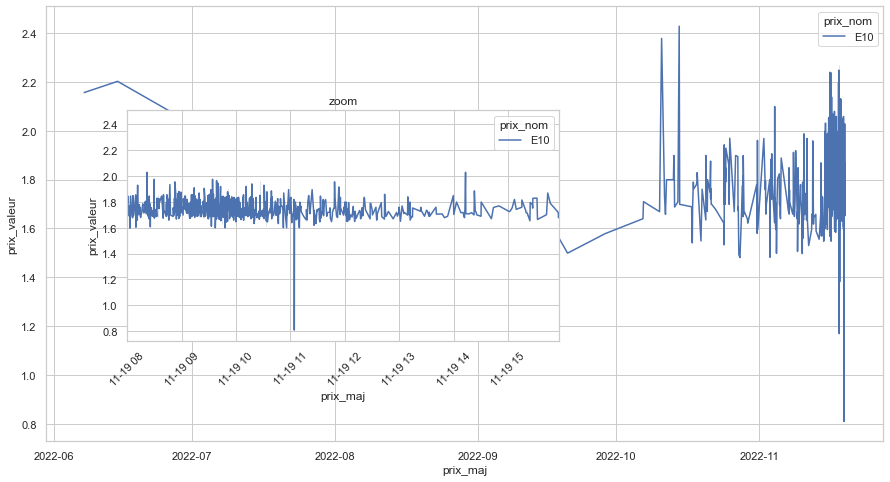

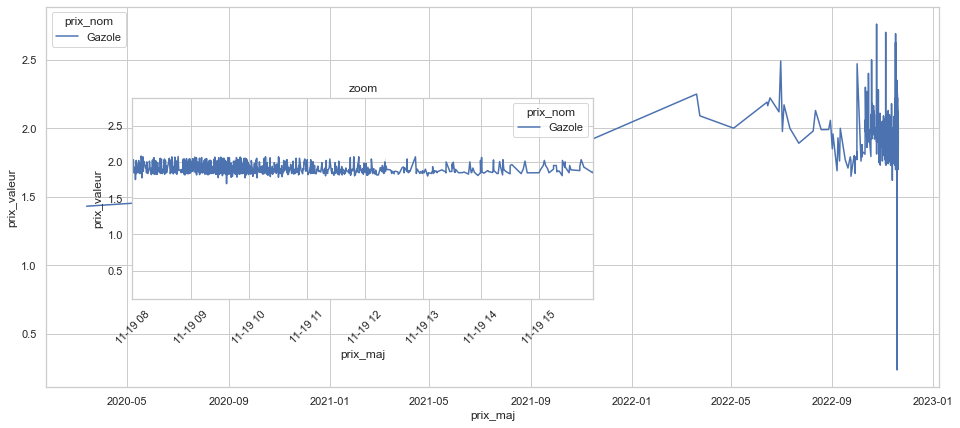

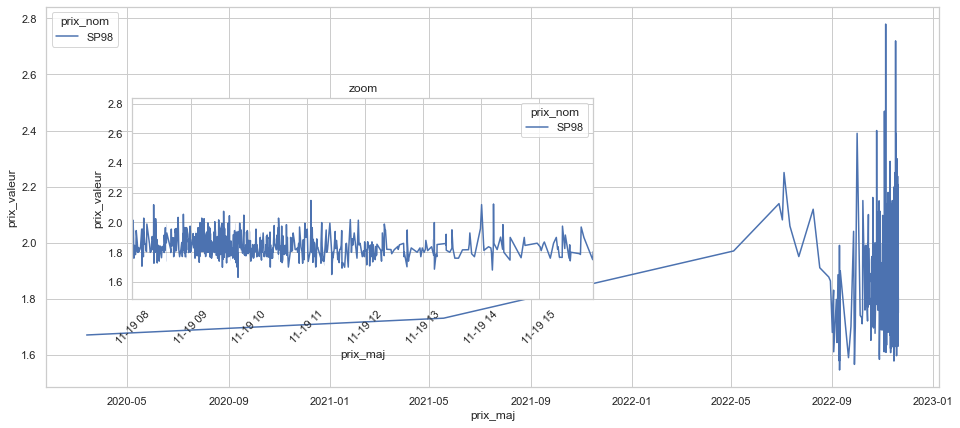

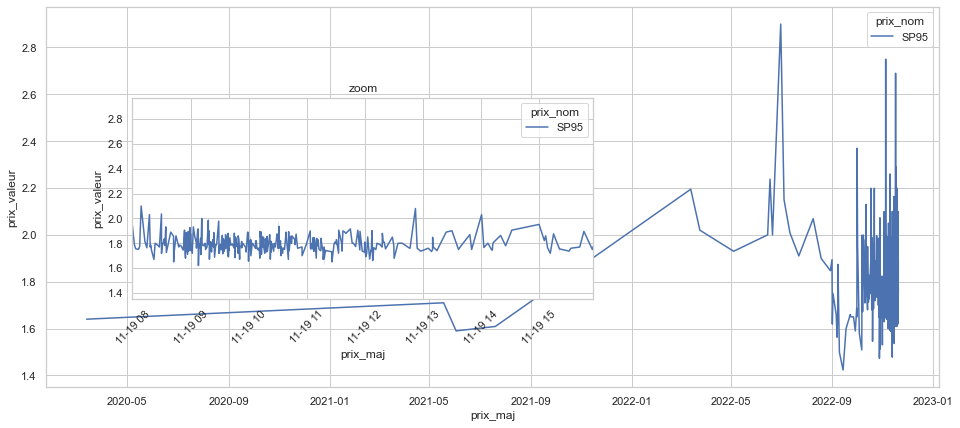

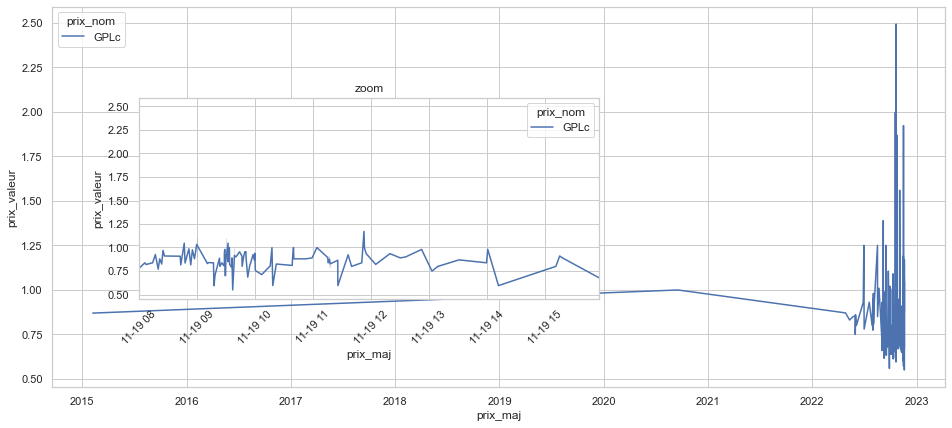

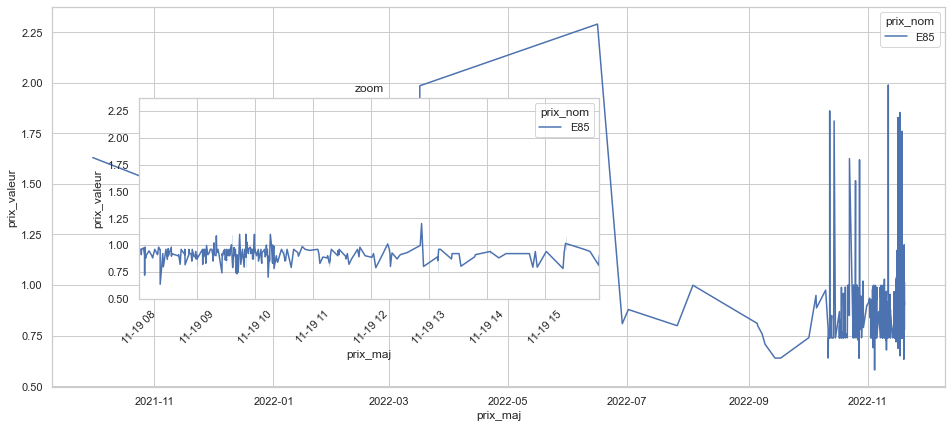

In [72]:
sns.set_theme(style="whitegrid")
for carbu in df_carburant_clean["prix_nom"].unique():
    fig, ax = plt.subplots()
    plt.rcParams['figure.figsize'] = [16,7]
    min = df_carburant_clean[df_carburant_clean['prix_maj']=='2022-11-19 08:00:00']['prix_maj'][39]
    max = df_carburant_clean['prix_maj'].max()
    #graphique
    sns.lineplot(data=df_carburant_clean, x="prix_maj", y="prix_valeur",
                     hue=df_carburant_clean[df_carburant_clean["prix_nom"]==carbu]["prix_nom"], ax=ax)
    #Graphe ZOOM
    ax2 = plt.axes([0.2, 0.3, .4, .4])
    sns.lineplot(data=df_carburant_clean, x="prix_maj", y="prix_valeur",
                     hue=df_carburant_clean[df_carburant_clean["prix_nom"]==carbu]["prix_nom"], ax=ax2)
    ax2.set_title('zoom')
    plt.xticks(rotation = 45)
    ax2.set_xlim(min,max)
    plt.show()

# Commentaire: 
#### Quelques commentaiires sur les types de carburant les plus utilisés par les automobilistes:

* Le super carburant **SP98** subit une croissance forte depuis mai 2022 pour atteindre **2.30 euros en été**. Depuis septembre ce carburant subit également d'importante majoration de prix et à la pompe le prix reste supérieur à **1,6 euros**.


* Le super carburant **SP95** quant-à lui enrégistre  une augmentation accrue du prix à la pompe depuis mai 2022 pour atteindre **2.85 euros en été**. Dépuis ocobre 2022 on remaque égalment des majorations et le prix reste au dessus de **1,70 euros**.

## <font color = 'red' id = 'section_7_2_2'> 7.2.2 Prix à la pompe par rapport au type de carburant en boites à moustaches

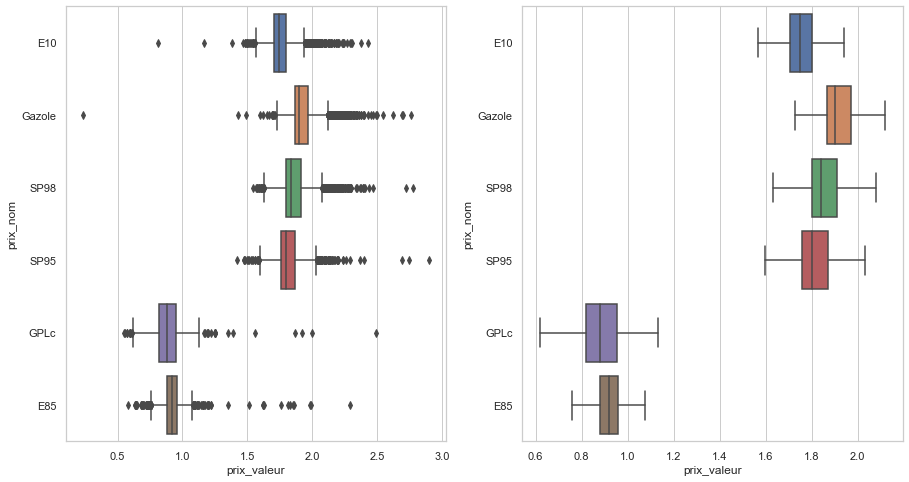

In [45]:
plt.rcParams['figure.figsize'] = [15,8]
f, axes = plt.subplots(1, 2)
sns.boxplot(x = df_carburant_clean['prix_valeur'], y= df_carburant_clean['prix_nom'], ax=axes[0])
sns.boxplot(x = df_carburant_clean['prix_valeur'], y= df_carburant_clean['prix_nom'], showfliers = False, ax=axes[1])
plt.show()

# Commentaire:

* Le superethanol **E85**  et le gaz de pétrole liquefié **GPLc** sont les types de carburant qui sont pas impactés semblent t-il car les prix se situent entre **85  et 0.95 euros** pour la plupart des stations.


* Contrairement à **E85**  et **GPLc**, les **Gazole**, **SP98**, **SP95**, **E10** ont des prix, pour la majorité des stations services, compris  en moyenne entre **1,70 et 1.90** à pompe. 

## <font color = 'red' id = 'section_7_2_3'> 7.2.3 Comparaison de la cherté des carburant généralement

In [46]:
df_carburant_clean.head(1)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,2022-11-18 20:10:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,Aucune,Non,45.917,6.128


In [47]:
df_carburant_clean.groupby('prix_nom')['prix_valeur'].mean()

prix_nom
E10       1.767304
E85       0.913148
GPLc      0.889190
Gazole    1.926533
SP95      1.819945
SP98      1.867168
Name: prix_valeur, dtype: float64

<AxesSubplot:xlabel='prix_nom'>

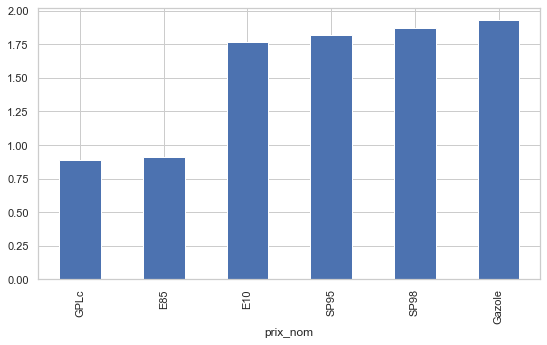

In [48]:
df_carburant_clean.groupby('prix_nom')['prix_valeur'].mean().sort_values().plot.bar(figsize =(9,5))

# Commentaire:
Le  super éthnoel **E85** et **GPLc** sont les types de carburant les moins sur le marché contrairement au **Gazole** qui est le plus onéreux.

Une petite recherche montre que la France importait ce type de catrburant de **Russie**, donc une cause probable de la hausse.

In [49]:
df_carburant_clean.head(2)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,2022-11-18 20:10:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,Aucune,Non,45.917000,6.128000
1,6140005,6140,976 avenue rhin et danube,vence,2022-11-18 14:24:06,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non,43.725185,7.096248


## <font color = 'red' id = 'section_7_2_4'> 7.2.4 Coût du carburant par rapport à la ville et la région

In [50]:
df_carburant_clean.groupby(['ville', 'prix_nom'])['prix_valeur'].mean()

ville               prix_nom
30320 MARGUERITTES  E10         1.934000
                    GPLc        1.045000
                    Gazole      2.074000
                    SP98        2.034000
ABBEVILLE           E10         1.698667
                                  ...   
Évreux              SP95        1.799000
                    SP98        1.814000
Évry                E10         1.833000
                    Gazole      2.066000
                    SP98        1.963000
Name: prix_valeur, Length: 23434, dtype: float64

In [51]:
df_carburant_clean.groupby(['reg_name', 'prix_nom'])['prix_valeur'].mean()

reg_name                    prix_nom
Auvergne-Rhône-Alpes        E10         1.804010
                            E85         0.925778
                            GPLc        0.908817
                            Gazole      1.936516
                            SP95        1.871986
                            SP98        1.916238
Bourgogne-Franche-Comté     E10         1.813840
                            E85         0.910000
                            GPLc        0.907703
                            Gazole      1.939838
                            SP95        1.892546
                            SP98        1.928832
Bretagne                    E10         1.701693
                            E85         0.901304
                            GPLc        0.872259
                            Gazole      1.884451
                            SP95        1.747298
                            SP98        1.793320
Centre-Val de Loire         E10         1.765204
                            E85 

## <font color = 'red' > Les 15 villes où le carburant est le moins cher

In [52]:
for type_car in df_carburant_clean['prix_nom'].unique():
    print(df_carburant_clean.loc[df_carburant_clean['prix_nom']==type_car,:].groupby(['ville',
                                    'prix_nom'])['prix_valeur'].min().sort_values().iloc[:15])

ville                    prix_nom
Albi                     E10         0.809
Roanne                   E10         1.169
Saint-Romain-de-Colbosc  E10         1.382
LA SALLE LES ALPES       E10         1.465
Plouigneau               E10         1.481
PITHIVIERS               E10         1.482
SABLE-SOLESMES           E10         1.493
REDON                    E10         1.497
ORANGE                   E10         1.498
AULNOYE-AYMERIES         E10         1.499
MONTIGNY-LE-BRETONNEUX   E10         1.506
INGERSHEIM               E10         1.512
St Eloy les Mines        E10         1.518
Mauléon-Licharre         E10         1.530
MAIZIèRES-LèS-METZ       E10         1.533
Name: prix_valeur, dtype: float64
ville                    prix_nom
Antran                   Gazole      0.234
Noyers                   Gazole      1.430
Boyer                    Gazole      1.490
COLOMBES                 Gazole      1.600
DAMEREY                  Gazole      1.619
AULNOYE-AYMERIES         Gazole      1

## Visualisation

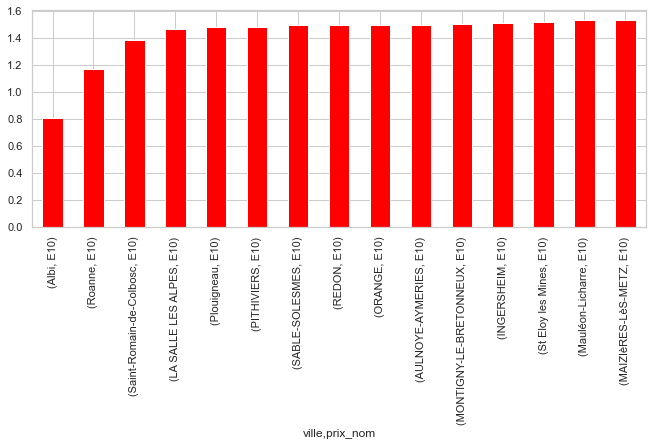

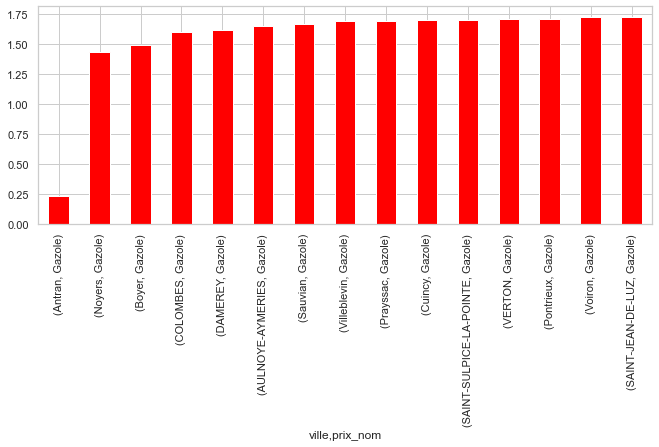

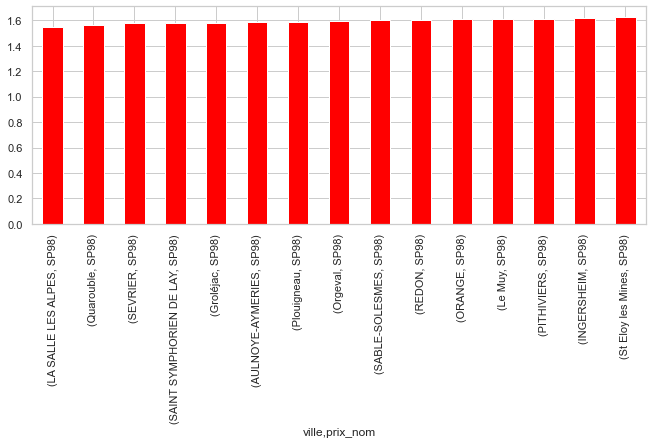

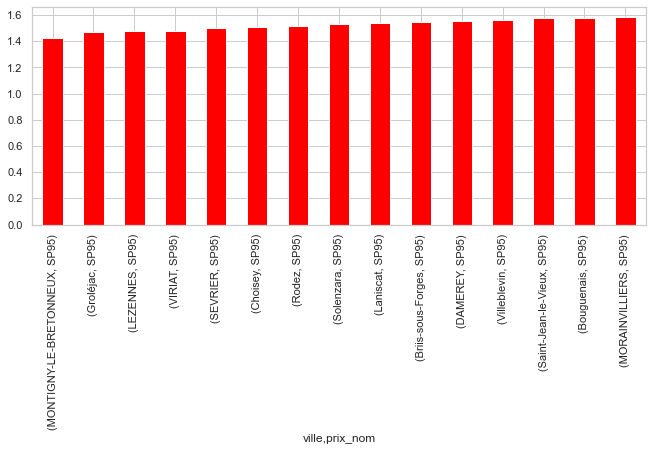

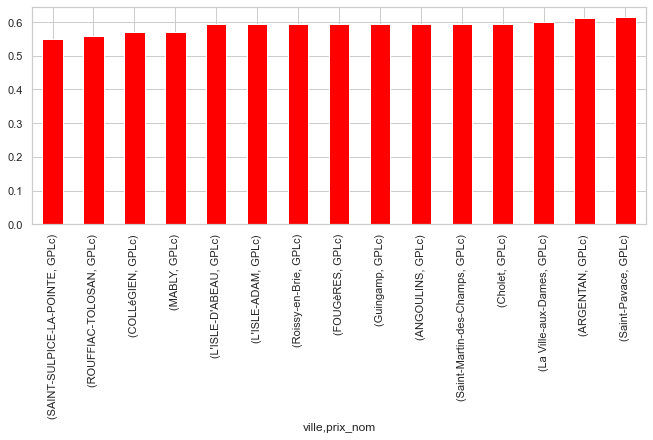

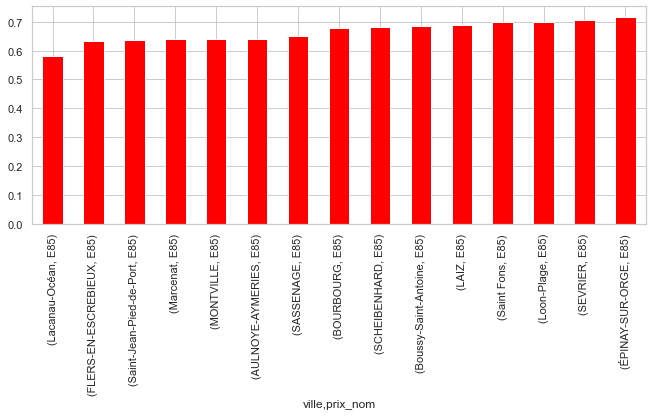

In [53]:
for type_car in df_carburant_clean['prix_nom'].unique():
    plt.figure()
    df_carburant_clean.loc[df_carburant_clean['prix_nom']==type_car,:].groupby(['ville',
                     'prix_nom'])['prix_valeur'].min().sort_values().iloc[:15].plot.bar(figsize = (11,4), color = 'red')

## <font color = 'red' > Les 15 villes où le carburant est le plus cher

In [54]:
for type_car in df_carburant_clean['prix_nom'].unique():
    print(df_carburant_clean.loc[df_carburant_clean['prix_nom']==type_car,:].groupby(['ville',
                                    'prix_nom'])['prix_valeur'].max().sort_values(ascending = False).iloc[:15])

ville                       prix_nom
Paris                       E10         2.429
Fos-sur-Mer                 E10         2.379
MONTROUGE                   E10         2.309
PARIS                       E10         2.299
CHAUMONT-SUR-THARONNE       E10         2.294
SAINT-MANDé                 E10         2.249
Seclin                      E10         2.240
Valleiry                    E10         2.239
Charenton-le-Pont           E10         2.239
Meunet-sur-Vatan            E10         2.229
LA MEMBROLLE-SUR-CHOISILLE  E10         2.203
Boissy saint léger          E10         2.199
Lamotte-Beuvron             E10         2.194
Theillay                    E10         2.184
CREIL                       E10         2.172
Name: prix_valeur, dtype: float64
ville                  prix_nom
PARIS                  Gazole      2.760
Paris                  Gazole      2.690
L'Île-d'Yeu            Gazole      2.627
CHAUMONT-SUR-THARONNE  Gazole      2.454
MONTROUGE              Gazole      2.429
Ch

# Commentaire: 
Sans grande étonnement, **Paris** reste la ville la plus cher pour la carburant **E10, SP95, SP98 et GAZOLE**.

## <font color = 'red'  id = 'section_8' > 8. Geolocalisation des stations services

In [55]:
df_carburant_clean.head(2)

,id,cp,adresse,ville,prix_maj,prix_id,prix_valeur,prix_nom,dep_code,reg_name,services_service,horaires_automate_24_24,Latitude,Longitude
0,74000004,74000,AVENUE DE LA PLAINE,Annecy,2022-11-18 20:10:00,5.0,1.825,E10,74,Auvergne-Rhône-Alpes,Aucune,Non,45.917000,6.128000
1,6140005,6140,976 avenue rhin et danube,vence,2022-11-18 14:24:06,5.0,1.849,E10,06,Provence-Alpes-Côte d'Azur,"Vente de gaz domestique (Butane, Propane)",Non,43.725185,7.096248


In [56]:
import plotly.express as px

In [57]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_carburant_clean, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="adresse", 
                        hover_data=["adresse"],
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=400,
                        width=800)
                        
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## <font color = 'red' id = 'section_8_1'> 8.1 Geolocalisation des 15 lieux où SP98 est le plus cher

In [58]:
df_geo_sp98pc = df_carburant_clean.loc[df_carburant_clean['prix_nom']=='SP98',['cp',"reg_name" ,"adresse",
         "ville", 'prix_valeur', "Latitude", "Longitude"]].sort_values(by = ['prix_valeur'], ascending = False).iloc[:15]

In [59]:
df_geo_sp98pc.head(15)

,cp,reg_name,adresse,ville,prix_valeur,Latitude,Longitude
8218,75007,Île-de-France,15 Avenue Duquesne,PARIS,2.780,48.853000,2.308000
19960,75116,Île-de-France,69 Avenue Kléber,Paris,2.720,48.865000,2.289000
26227,75016,Île-de-France,99 Avenue de Versailles,Paris,2.469,48.845000,2.272000
13515,13660,Provence-Alpes-Côte d'Azur,Vieille Route de Saint-Rémy,Orgon,2.437,43.796200,4.989730
19263,41600,Centre-Val de Loire,AUTOROUTE A 71,CHAUMONT-SUR-THARONNE,2.404,47.618000,1.963000
13553,48500,Occitanie,Avenue du Lot,BANASSAC,2.400,44.436616,3.200748
24409,93400,Île-de-France,23 Boulevard Victor Hugo,Saint-Ouen,2.390,48.911000,2.332000
15522,75001,Île-de-France,"8,10,10bis Rue Bailleul",PARIS,2.390,48.861000,2.341000
7791,75116,Île-de-France,PLACE TATTEGRAIN,PARIS,2.379,48.864000,2.272000
413,36150,Centre-Val de Loire,A20 AIRE DES CHAMPS D' AMOUR,Meunet-sur-Vatan,2.369,47.078000,1.862000


In [60]:
df_geo_sp98pc.shape

(15, 7)

In [61]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_geo_sp98pc, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="adresse", 
                        hover_data=["adresse"],
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=400,
                        width=800)
                        
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## <font color = 'red' id = 'section_8_2'> 8.2  Geolocalisation des 15 lieux où SP98 est le moins cher

In [62]:
df_geo_SP98_mc = df_carburant_clean.loc[df_carburant_clean['prix_nom']=='SP98',['cp',"reg_name" ,"adresse",
         "ville", 'prix_valeur', "Latitude", "Longitude"]].sort_values(by = ['prix_valeur'], ascending = True).iloc[:15]

In [63]:
df_geo_SP98_mc.head(15)

,cp,reg_name,adresse,ville,prix_valeur,Latitude,Longitude
26396,5240,Provence-Alpes-Côte d'Azur,60 Rue de la Guisane,LA SALLE LES ALPES,1.545,44.947000,6.559000
1990,59243,Hauts-de-France,221 avenue Jean Jaurès,Quarouble,1.565,50.387439,3.623189
25008,74320,Auvergne-Rhône-Alpes,754 route d'albertville,SEVRIER,1.577,45.856000,6.143000
7935,42470,Auvergne-Rhône-Alpes,100 route de lyon,SAINT SYMPHORIEN DE LAY,1.577,45.946000,4.220000
12023,24250,Nouvelle-Aquitaine,le bourg,Groléjac,1.583,44.820868,1.290578
15279,59620,Hauts-de-France,Rue Mirabeau,AULNOYE-AYMERIES,1.589,50.210573,3.830897
16576,29610,Bretagne,Prat al lann,Plouigneau,1.591,48.577000,-3.784000
29224,78630,Île-de-France,116 Avenue Pasteur,Orgeval,1.596,48.925000,1.976000
29334,72300,Pays de la Loire,Avenue Jean Monnet,SABLE-SOLESMES,1.603,47.835000,-0.298000
19108,35600,Bretagne,84 rue de Vannes,REDON,1.607,47.644000,-2.092000


In [64]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_geo_SP98_mc, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="adresse", 
                        hover_data=["adresse"],
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=400,
                        width=800)
                        
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## <font color = 'red' id = 'section_8_3'> 8.3   Geolocalisation des 10 lieux où SP95 est le plus cher

In [65]:
df_geo_sp95pc = df_carburant_clean.loc[df_carburant_clean['prix_nom']=='SP95',['cp',"reg_name" ,"adresse",
         "ville", 'prix_valeur', "Latitude", "Longitude"]].sort_values(by = ['prix_valeur'], ascending = False).iloc[:10]

In [66]:
df_geo_sp95pc.head(10)

,cp,reg_name,adresse,ville,prix_valeur,Latitude,Longitude
21758,75011,Île-de-France,175 Avenue Ledru-Rollin,PARIS,2.900,48.85667,2.37910
30867,75007,Île-de-France,15 Avenue Duquesne,PARIS,2.750,48.85300,2.30800
18467,75116,Île-de-France,69 Avenue Kléber,Paris,2.690,48.86500,2.28900
9129,85350,Pays de la Loire,9 Rue Neptune,L'Île-d'Yeu,2.398,46.72342,-2.34468
12743,75001,Île-de-France,"8,10,10bis Rue Bailleul",PARIS,2.370,48.86100,2.34100
18600,93400,Île-de-France,23 Boulevard Victor Hugo,Saint-Ouen,2.290,48.91100,2.33200
3624,73480,Auvergne-Rhône-Alpes,1 ROUTE DE L'ISERAN,Lanslebourg-Mont-Cenis,2.260,45.28600,6.88400
21390,75008,Île-de-France,164 Boulevard Haussmann,PARIS,2.240,48.87500,2.31000
20072,20148,Corse,Noce,COZZANO,2.238,41.93500,9.15800
22210,73610,Auvergne-Rhône-Alpes,3320 ROUTE DU LAC,Saint-Alban-de-Montbel,2.202,45.54400,5.76300


In [67]:
df_geo_sp95pc.shape

(10, 7)

In [68]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_geo_sp95pc, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="adresse", 
                        hover_data=["adresse"],
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=400,
                        width=800)
                        
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## <font color = 'red' id = 'section_8_4'> 8.4  Geolocalisation des 10 lieux où SP95 est le moins cher

In [69]:
df_geo_SP95_mc = df_carburant_clean.loc[df_carburant_clean['prix_nom']=='SP95',['cp',"reg_name" ,"adresse",
         "ville", 'prix_valeur', "Latitude", "Longitude"]].sort_values(by = ['prix_valeur'], ascending = True).iloc[:10]

In [70]:
df_geo_SP95_mc.head(10)

,cp,reg_name,adresse,ville,prix_valeur,Latitude,Longitude
803,78180,Île-de-France,13 Avenue Ampère,MONTIGNY-LE-BRETONNEUX,1.423,48.798000,2.048000
8882,24250,Nouvelle-Aquitaine,le bourg,Groléjac,1.473,44.820868,1.290578
19375,59260,Hauts-de-France,BOULEVARD DE TOURNAI,LEZENNES,1.478,50.616453,3.118945
2951,1440,Auvergne-Rhône-Alpes,Route de Strasbourg,VIRIAT,1.481,46.236000,5.263000
9525,74320,Auvergne-Rhône-Alpes,754 route d'albertville,SEVRIER,1.499,45.856000,6.143000
1446,39100,Bourgogne-Franche-Comté,7 rn 73,Choisey,1.509,47.064380,5.454830
3853,12000,Occitanie,33 Bd Paul ramadier,Rodez,1.513,44.359219,2.569852
6641,20145,Corse,RN T 10,Solenzara,1.530,41.857886,9.364222
24134,22570,Bretagne,7 rue du Blavet,Laniscat,1.536,48.227000,-3.176000
2128,91640,Île-de-France,AUTOROUTE A10 - AIRE DE LIMOURS BRIIS SOUS FORGES,Briis-sous-Forges,1.546,48.634770,2.147560


In [71]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_geo_SP95_mc, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="adresse", 
                        hover_data=["adresse"],
                        color_continuous_scale=color_scale,
                        zoom=8, 
                        height=400,
                        width=800)
                        
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [73]:
df_carburant_r = pd.read_csv("prix-carburants-fichier-instantane-test-ods-copie.csv", sep = ';')

In [74]:
df_carburant_r.head()

,id,cp,pop,adresse,ville,horaires,geom,prix_maj,prix_id,prix_valeur,prix_nom,com_arm_code,com_arm_name,epci_code,epci_name,dep_code,dep_name,reg_code,reg_name,com_code,com_name,services_service,horaires_automate_24_24
0,74000004,74000,R,AVENUE DE LA PLAINE,Annecy,"{""@automate-24-24"": """", ""jour"": [{""@id"": ""1"", ...","45.917,6.128",2022-11-18T20:10:00+01:00,5.0,1.825,E10,74010,Annecy,200066793.0,CA du Grand Annecy,74,Haute-Savoie,84.0,Auvergne-Rhône-Alpes,74010,Annecy,NaN,Non
1,6140005,6140,R,976 avenue rhin et danube,vence,NaN,"43.7251854,7.0962481",2022-11-18T14:24:06+01:00,5.0,1.849,E10,06157,Vence,200030195.0,Métropole Nice Côte d'Azur,06,Alpes-Maritimes,93.0,Provence-Alpes-Côte d'Azur,06157,Vence,"Vente de gaz domestique (Butane, Propane)",Non
2,43110001,43110,R,Avenue de Firminy,AUREC-SUR-LOIRE,NaN,"45.36955,4.20235",2022-11-19T09:04:21+01:00,1.0,2.065,Gazole,43012,Aurec-sur-Loire,244301131.0,CC Loire et Semène,43,Haute-Loire,84.0,Auvergne-Rhône-Alpes,43012,Aurec-sur-Loire,Vente de fioul domestique//Vente de pétrole la...,Non
3,79000004,79000,R,226 Avenue de la Rochelle,Niort,NaN,"46.31087,-0.48038",NaN,NaN,NaN,NaN,79191,Niort,200041317.0,CA du Niortais,79,Deux-Sèvres,75.0,Nouvelle-Aquitaine,79191,Niort,Boutique alimentaire//Boutique non alimentaire...,Non
4,71240008,71240,A,Autoroute A6,Saint-Ambreuil,"{""@automate-24-24"": """", ""jour"": [{""@id"": ""1"", ...","46.691945189175,4.8451681799291",2022-11-17T10:30:18+01:00,6.0,1.937,SP98,71384,Saint-Ambreuil,247103765.0,CC Entre Saône et Grosne,71,Saône-et-Loire,27.0,Bourgogne-Franche-Comté,71384,Saint-Ambreuil,Toilettes publiques//Douches//Boutique aliment...,Non
